# 이미지 생성/편집 서비스 테스트 (Gemini 버전)

`app` 폴더 내부의 이미지 생성 로직을 테스트합니다.

**테스트 흐름**:
1. 새 캐릭터 이미지 생성 (베이스) - Nova Canvas
2. 특정 부위 수정 (장발 등) - Google Gemini
3. 시간 흐름 반영 (10년 후) - Google Gemini

**테스트 대상 서비스:**
- `PromptService`: Claude를 이용한 프롬프트 최적화
- `BedrockService`: Nova Canvas 이미지 생성
- `GeminiService`: Gemini (Nano Banana) 이미지 편집

> ⚠️ **S3 업로드 비활성화**: 테스트 중에는 S3 업로드를 건너뛰고 로컬 파일로 저장합니다.

## 1. 환경 설정

In [1]:
import os
import sys
from pathlib import Path

# 프로젝트 루트를 sys.path에 추가
PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

print(f"프로젝트 루트: {PROJECT_ROOT}")

프로젝트 루트: c:\jungle\weapon\sto-link-image-backend


In [2]:
# .env 파일 로드
from dotenv import load_dotenv

env_path = PROJECT_ROOT / '.env'
load_dotenv(env_path)

# 환경 변수 확인
print("환경 변수 확인:")
print(f"  AWS_ACCESS_KEY_ID: {'✅ 설정됨' if os.getenv('AWS_ACCESS_KEY_ID') else '❌ 미설정'}")
print(f"  AWS_SECRET_ACCESS_KEY: {'✅ 설정됨' if os.getenv('AWS_SECRET_ACCESS_KEY') else '❌ 미설정'}")
print(f"  AWS_REGION: {os.getenv('AWS_REGION', '❌ 미설정')}")
print(f"  GEMINI_API_KEY: {'✅ 설정됨' if os.getenv('GEMINI_API_KEY') else '❌ 미설정'}")

환경 변수 확인:
  AWS_ACCESS_KEY_ID: ✅ 설정됨
  AWS_SECRET_ACCESS_KEY: ✅ 설정됨
  AWS_REGION: us-east-1
  GEMINI_API_KEY: ✅ 설정됨


In [3]:
# 테스트용 이미지 저장 폴더
TEST_IMAGES_FOLDER = Path.cwd() / "generated_images"
TEST_IMAGES_FOLDER.mkdir(exist_ok=True)
print(f"\n이미지 저장 폴더: {TEST_IMAGES_FOLDER}")


이미지 저장 폴더: c:\jungle\weapon\sto-link-image-backend\test\generated_images


## 2. 서비스 임포트

In [4]:
from app.services.prompt_service import get_prompt_service
from app.services.bedrock_service import get_bedrock_service
from app.services.gemini_service import get_gemini_service

print("✅ 서비스 임포트 완료")

✅ 서비스 임포트 완료


## 3. 유틸리티 함수

In [5]:
from datetime import datetime
from IPython.display import Image, display

def save_image_locally(image_bytes: bytes, prefix: str) -> str:
    """이미지 바이트를 로컬 파일로 저장하고 경로 반환"""
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{prefix}_{timestamp}.png"
    filepath = TEST_IMAGES_FOLDER / filename
    
    with open(filepath, "wb") as f:
        f.write(image_bytes)
    
    print(f"💾 이미지 저장됨: {filepath}")
    return str(filepath)

def show_image(image_path: str, title: str = ""):
    """Jupyter에서 이미지 표시"""
    if title:
        print(f"\n=== {title} ===")
    display(Image(filename=image_path, width=400))

---
## 4. 개별 서비스 테스트

각 서비스를 개별적으로 테스트하여 정상 작동 여부를 확인합니다.

### 4.1 PromptService 테스트 (Claude 프롬프트 생성)

In [6]:
# 프롬프트 서비스 초기화
prompt_service = get_prompt_service()
print("✅ PromptService 초기화 완료")

✅ PromptService 초기화 완료


In [7]:
# 캐릭터 생성용 프롬프트 테스트
test_message = "검은색 정장을 입은 카리스마 있는 20대 한국인 남성"

print(f"입력: {test_message}")
print("\n프롬프트 생성 중...")

enhanced_prompt = prompt_service.create_character_prompt(test_message)

print(f"\n✅ 생성된 프롬프트:")
print(enhanced_prompt)

입력: 검은색 정장을 입은 카리스마 있는 20대 한국인 남성

프롬프트 생성 중...

✅ 생성된 프롬프트:
a high-resolution, professional passport-style photo of a charismatic Korean man in his 20s, wearing a sleek black suit, looking directly at the camera with a confident expression, shot against a clean, neutral background, sharp facial details, professional studio lighting, crisp and clear image quality, front-facing pose, shoulders visible, styled hair, neutral facial expression


In [8]:
# 이미지 편집용 프롬프트 테스트 (Gemini용 - 단일 프롬프트)
edit_request = "기존 인물과 얼굴은 똑같이 유지하되, 머리 길이를 어깨까지 오는 장발로 바꾸고 왼쪽 눈가에 얇은 칼자국 상처를 하나 추가해줘."

print(f"입력: {edit_request}")
print("\n편집 프롬프트 생성 중...")

edit_prompt = prompt_service.create_edit_prompt(edit_request)

print(f"\n✅ 생성된 편집 프롬프트:")
print(edit_prompt)

입력: 기존 인물과 얼굴은 똑같이 유지하되, 머리 길이를 어깨까지 오는 장발로 바꾸고 왼쪽 눈가에 얇은 칼자국 상처를 하나 추가해줘.

편집 프롬프트 생성 중...

✅ 생성된 편집 프롬프트:
Keep the existing person's face and identity exactly the same, but change the hair length to long hair reaching the shoulders, and add a thin, vertical scar line near the left eye.


### 4.2 BedrockService 테스트 (이미지 생성)

In [9]:
# Bedrock 서비스 초기화
bedrock_service = get_bedrock_service()
print("✅ BedrockService 초기화 완료")
print(f"  Claude Model: {bedrock_service.claude_model_id}")
print(f"  Nova Canvas: {bedrock_service.nova_canvas_model_id}")

✅ BedrockService 초기화 완료
  Claude Model: us.anthropic.claude-3-5-haiku-20241022-v1:0
  Nova Canvas: amazon.nova-canvas-v1:0



🎨 Nova Canvas 이미지 생성 중... (30초~1분 소요)
✅ 이미지 생성 완료: 1,517,805 bytes
💾 이미지 저장됨: c:\jungle\weapon\sto-link-image-backend\test\generated_images\base_character_20251227_173407.png

=== 베이스 캐릭터 이미지 ===


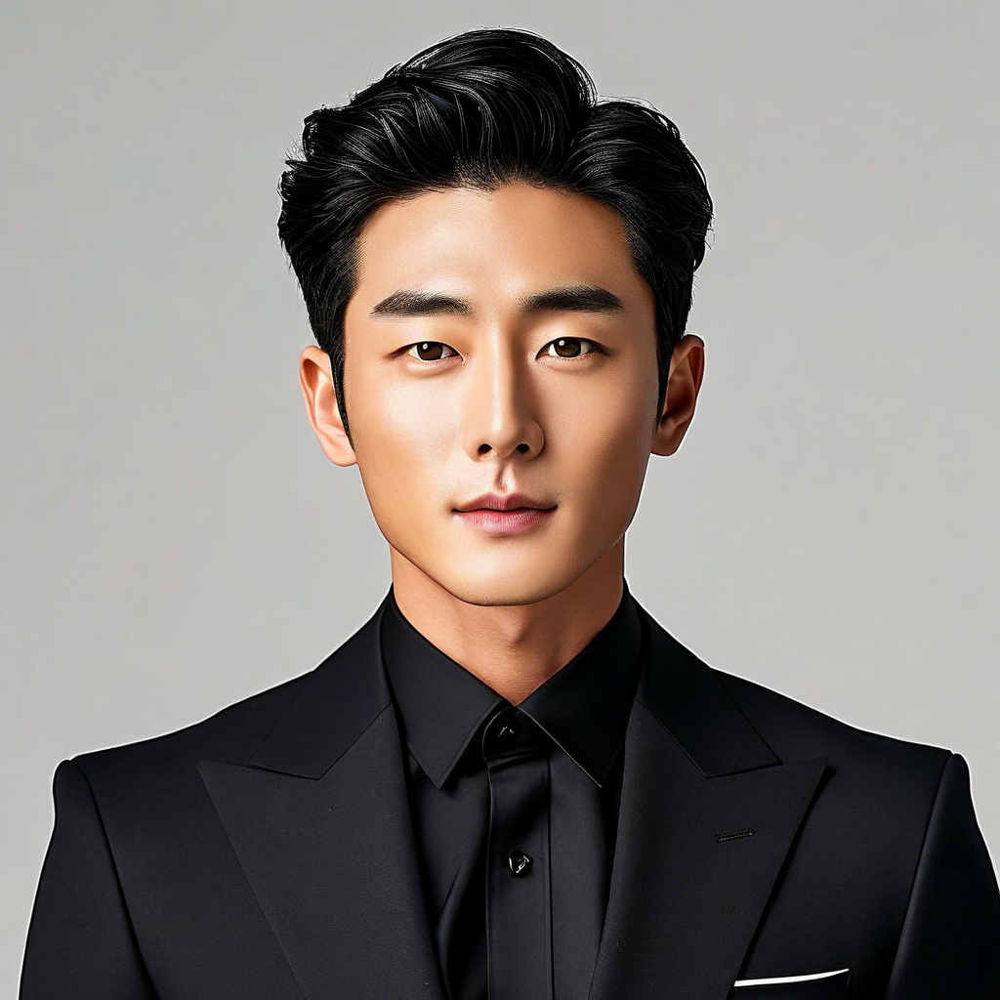

In [10]:
# Nova Canvas로 이미지 생성
print("\n🎨 Nova Canvas 이미지 생성 중... (30초~1분 소요)")

image_bytes = bedrock_service.invoke_nova_canvas(
    prompt=enhanced_prompt,
    negative_prompt="blurry, distorted, low quality, deformed face"
)

print(f"✅ 이미지 생성 완료: {len(image_bytes):,} bytes")

# 로컬에 저장
base_image_path = save_image_locally(image_bytes, "base_character")
show_image(base_image_path, "베이스 캐릭터 이미지")

### 4.3 GeminiService 테스트 (이미지 편집)

In [11]:
# Gemini 서비스 초기화
gemini_service = get_gemini_service()
print("✅ GeminiService 초기화 완료")
print(f"  Gemini Model: {gemini_service.model_id}")

✅ GeminiService 초기화 완료
  Gemini Model: gemini-2.5-flash-image



✏️ Gemini 이미지 편집 중... (30초~1분 소요)
✅ 이미지 편집 완료: 1,429,820 bytes
💾 이미지 저장됨: c:\jungle\weapon\sto-link-image-backend\test\generated_images\gemini_edited_feature_20251227_173419.png

=== 특징 수정 이미지 (Gemini) ===


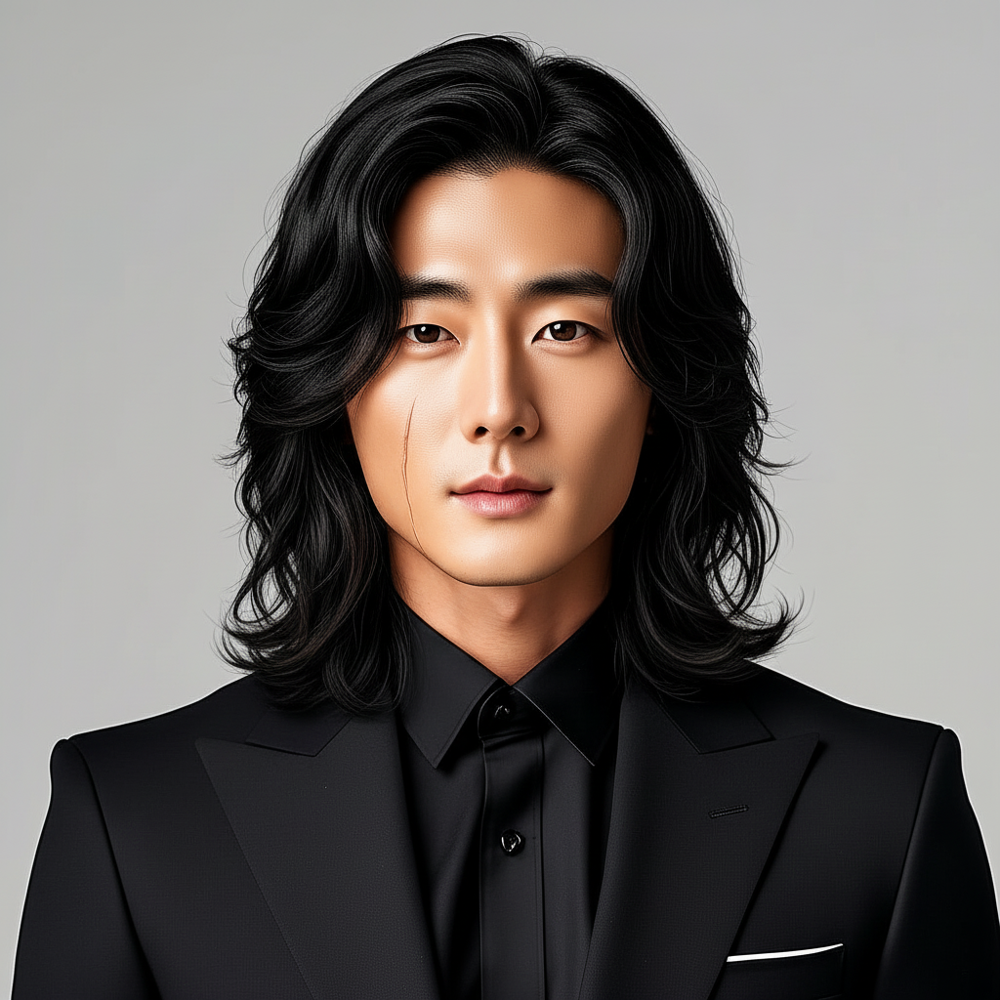

In [12]:
# Gemini로 이미지 편집
print("\n✏️ Gemini 이미지 편집 중... (30초~1분 소요)")

# 위에서 생성한 이미지 로드
with open(base_image_path, "rb") as f:
    source_image_bytes = f.read()

edited_bytes = gemini_service.edit_image(
    image_bytes=source_image_bytes,
    edit_prompt=edit_prompt
)

print(f"✅ 이미지 편집 완료: {len(edited_bytes):,} bytes")

# 로컬에 저장
edited_image_path = save_image_locally(edited_bytes, "gemini_edited_feature")
show_image(edited_image_path, "특징 수정 이미지 (Gemini)")

---
## 5. 전체 워크플로우 테스트

### 5.1 시간 흐름 반영 (10년 후)

In [13]:
print("="*50)
print("[시간 흐름] 캐릭터의 10년 후 모습 생성 중...")
print("="*50)

age_edit_msg = "이 인물이 10년 후 모습을 보여줘. 머리에 흰머리가 섞이고 자연스럽게 나이 든 모습으로."
print(f"\n편집 요청: {age_edit_msg}")

# 편집 프롬프트 생성
age_edit_prompt = prompt_service.create_edit_prompt(age_edit_msg)
print(f"\n생성된 프롬프트:")
print(age_edit_prompt)

[시간 흐름] 캐릭터의 10년 후 모습 생성 중...

편집 요청: 이 인물이 10년 후 모습을 보여줘. 머리에 흰머리가 섞이고 자연스럽게 나이 든 모습으로.

생성된 프롬프트:
Age this person naturally by about 10 years, adding salt-and-pepper gray hair with subtle aging signs while precisely preserving their original facial identity and core features.



✏️ Gemini 이미지 편집 중... (30초~1분 소요)
💾 이미지 저장됨: c:\jungle\weapon\sto-link-image-backend\test\generated_images\gemini_edited_aged_20251227_173430.png

=== 10년 후 이미지 (Gemini) ===


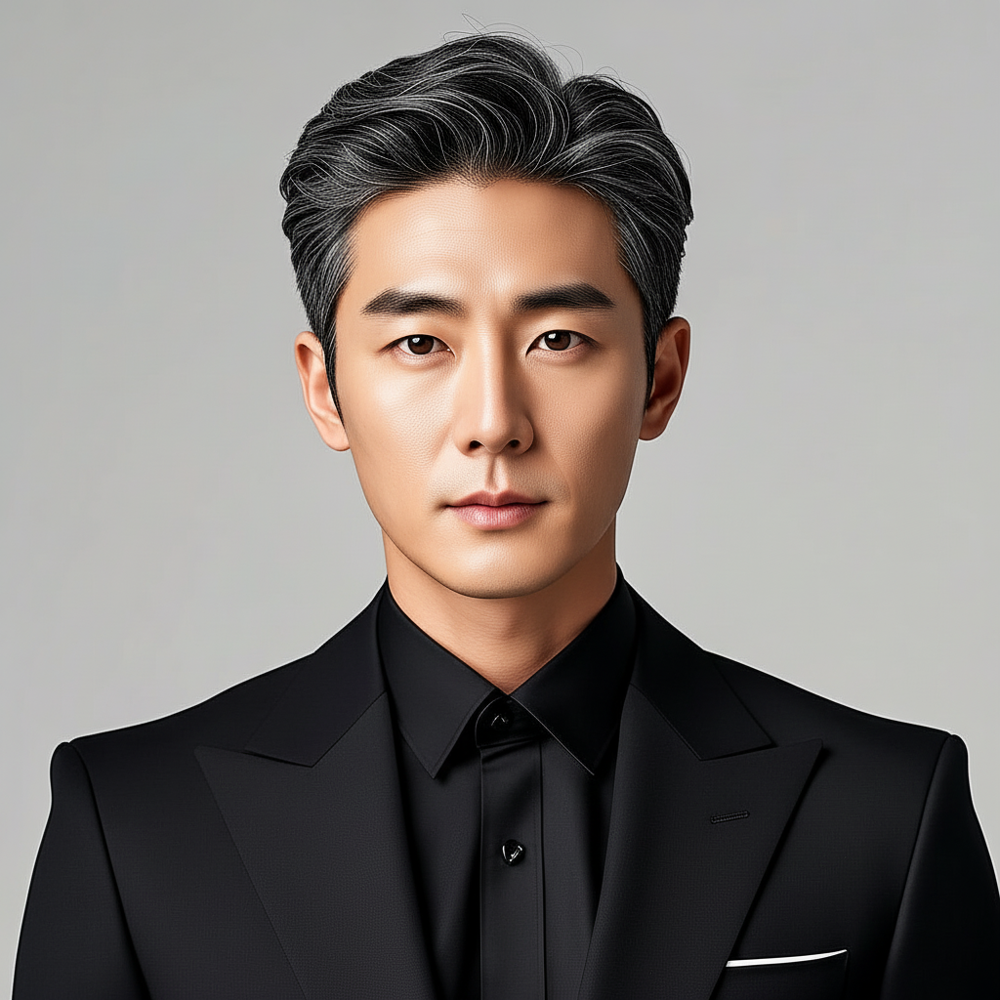

In [14]:
# 10년 후 이미지 생성
print("\n✏️ Gemini 이미지 편집 중... (30초~1분 소요)")

with open(base_image_path, "rb") as f:
    source_bytes = f.read()

aged_bytes = gemini_service.edit_image(
    image_bytes=source_bytes,
    edit_prompt=age_edit_prompt
)

aged_image_path = save_image_locally(aged_bytes, "gemini_edited_aged")
show_image(aged_image_path, "10년 후 이미지 (Gemini)")

---
## 6. 결과 요약

In [15]:
print("=" * 50)
print("전체 테스트 완료!")
print("=" * 50)

print(f"\n📁 이미지 저장 폴더: {TEST_IMAGES_FOLDER}")
print(f"\n✅ 생성된 이미지 파일들:")

try:
    print(f"  1. 베이스 이미지: {base_image_path}")
except NameError:
    print("  1. 베이스 이미지: (미생성)")

try:
    print(f"  2. 특징 수정 이미지: {edited_image_path}")
except NameError:
    print("  2. 특징 수정 이미지: (미생성)")

try:
    print(f"  3. 10년 후 이미지: {aged_image_path}")
except NameError:
    print("  3. 10년 후 이미지: (미생성)")

전체 테스트 완료!

📁 이미지 저장 폴더: c:\jungle\weapon\sto-link-image-backend\test\generated_images

✅ 생성된 이미지 파일들:
  1. 베이스 이미지: c:\jungle\weapon\sto-link-image-backend\test\generated_images\base_character_20251227_173407.png
  2. 특징 수정 이미지: c:\jungle\weapon\sto-link-image-backend\test\generated_images\gemini_edited_feature_20251227_173419.png
  3. 10년 후 이미지: c:\jungle\weapon\sto-link-image-backend\test\generated_images\gemini_edited_aged_20251227_173430.png


## 7. 이미지 비교


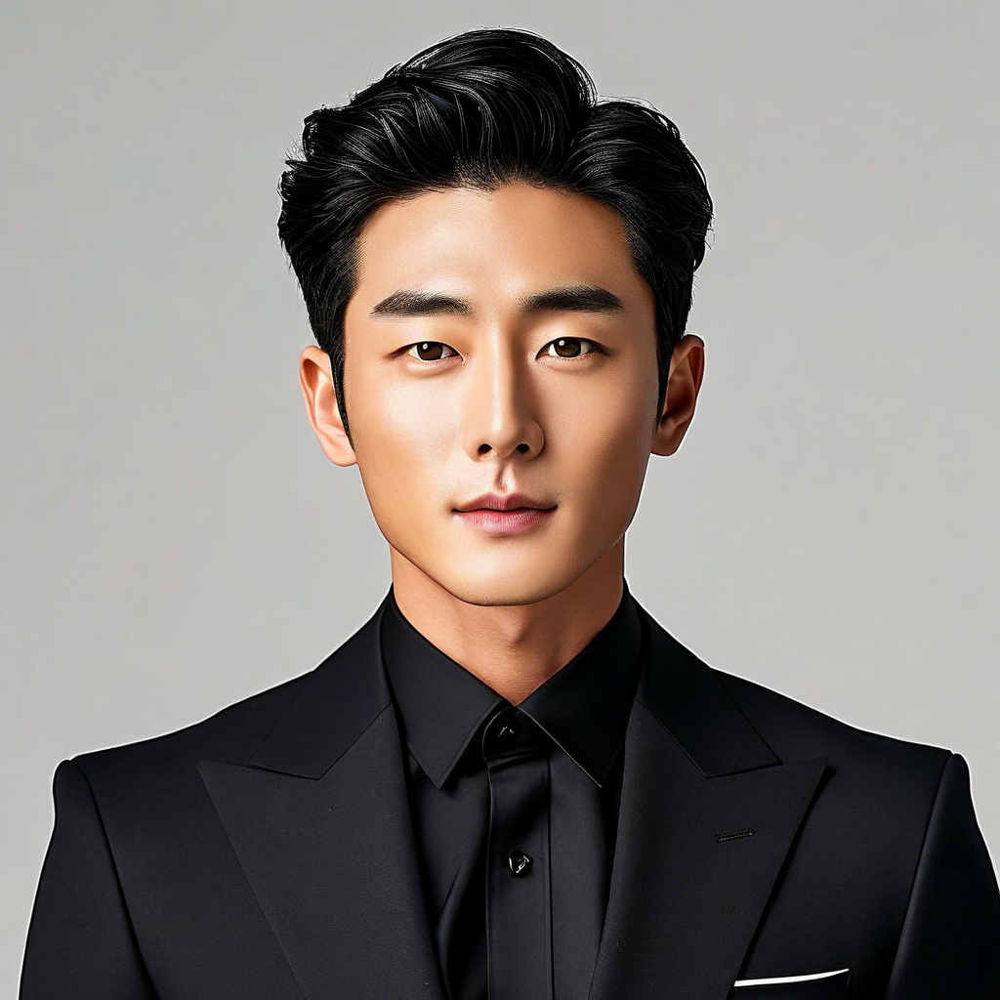
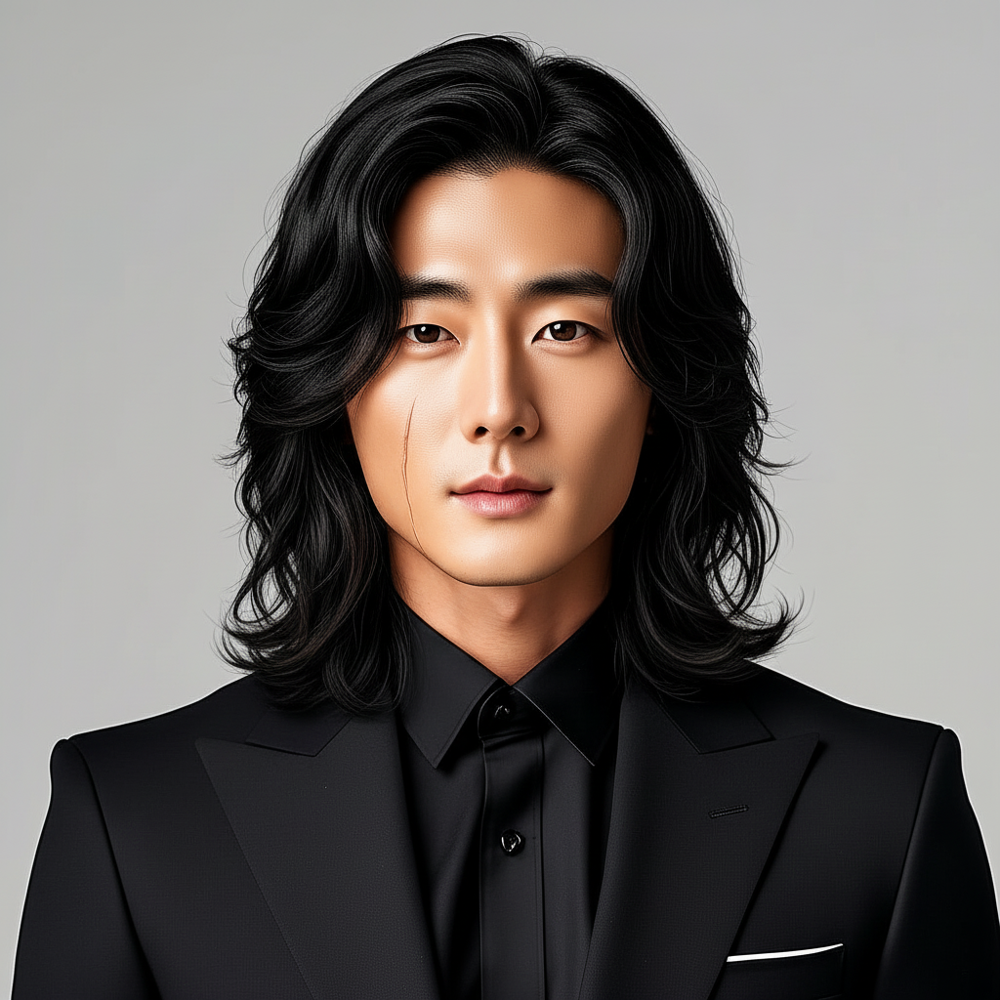
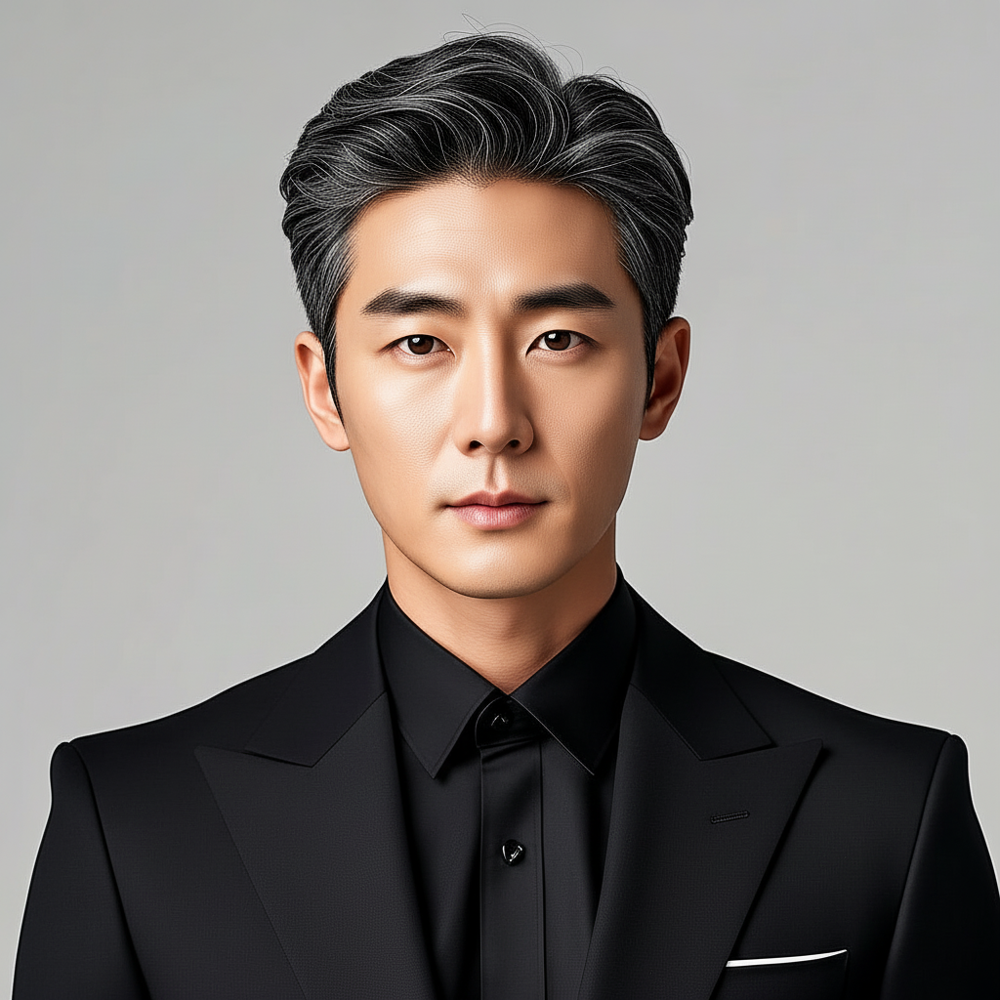

In [16]:
from IPython.display import HTML
import base64

def image_to_base64(path: str) -> str:
    with open(path, "rb") as f:
        return base64.b64encode(f.read()).decode()

try:
    html = f"""
    <div style="display: flex; justify-content: space-around; gap: 10px; flex-wrap: wrap;">
        <div style="text-align: center;">
            <img src="data:image/png;base64,{image_to_base64(base_image_path)}" style="max-width: 280px;">
            <p><b>1. 베이스 이미지</b></p>
        </div>
        <div style="text-align: center;">
            <img src="data:image/png;base64,{image_to_base64(edited_image_path)}" style="max-width: 280px;">
            <p><b>2. 특징 수정 (Gemini)</b></p>
        </div>
        <div style="text-align: center;">
            <img src="data:image/png;base64,{image_to_base64(aged_image_path)}" style="max-width: 280px;">
            <p><b>3. 10년 후 (Gemini)</b></p>
        </div>
    </div>
    """
    display(HTML(html))
except NameError:
    print("⚠️ 이미지 비교를 위해서는 먼저 위의 테스트 셀들을 실행해주세요.")